<Figure size 800x800 with 0 Axes>

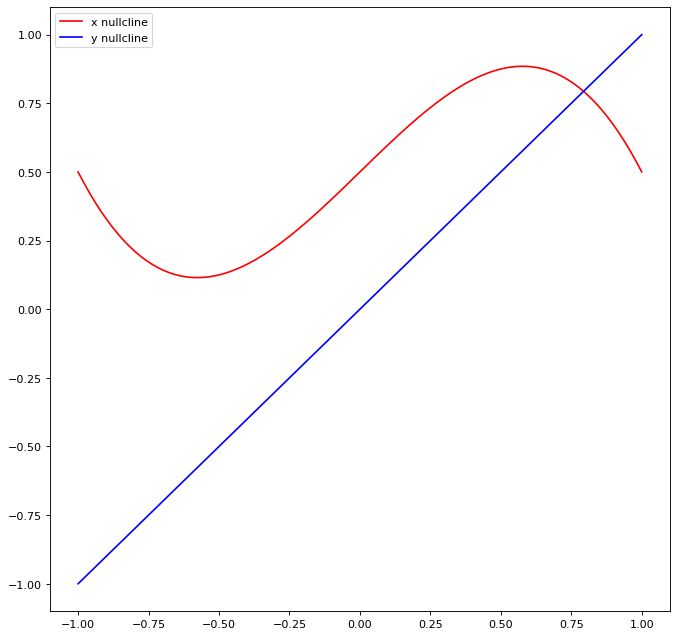

In [8]:
# Integrate the following differential equations
# dx/dt = x - x^3 - y
# dy/dt = -a*y + x
# with initial conditions x(0) = 0.1, y(0) = 0.1

# First plot the nullclines

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import os
from IPython.display import clear_output
import glob
from IPython.display import Image

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
from IPython import display
def dxdt(x, y, I):
    return x - x**3 - y - I

def dydt(x, y, a):
    return -a*y + x

def x_nullcline(x, a):
    return x-x**3 - I

def y_nullcline(y, a):
    return 1/a*x

x = np.linspace(-1, 1, 100)
y = np.linspace(-1, 1, 100)

I = -0.5
a = 1
figure(figsize=(10,10), dpi=80)
plt.plot(x, x_nullcline(x, a), label='x nullcline', color = 'red')
plt.plot(y, y_nullcline(y, a), label='y nullcline', color = 'blue')
plt.legend()
plt.show()

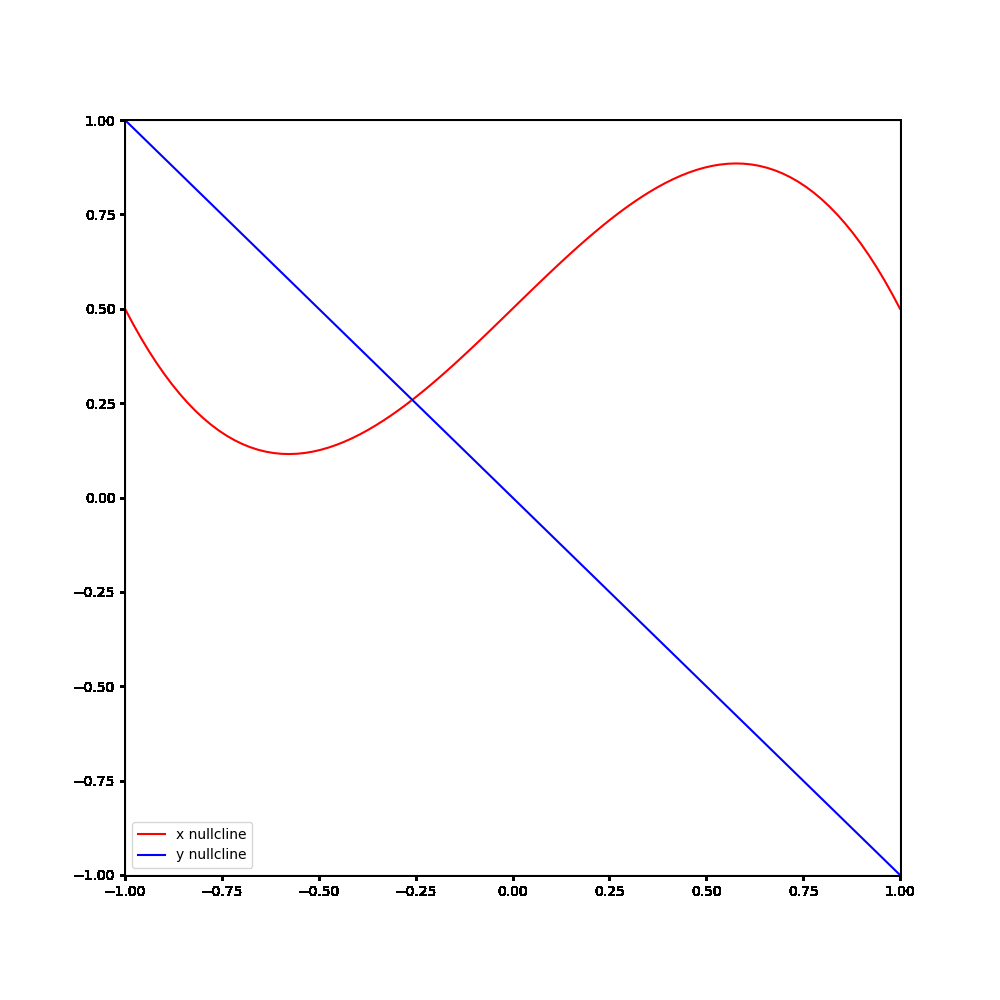

In [9]:
# changing value of a and seeing the effect on the nullclines
from IPython.display import clear_output

a_list = np.linspace(-1,1,100)
k = 0 
for a in a_list:
    k = k +1
    figure(figsize=(10,10), dpi=100)
    plt.plot(x, x_nullcline(x, a), label='x nullcline', color = 'red')
    plt.plot(y, y_nullcline(y, a), label='y nullcline', color = 'blue')
    plt.legend()
    plt.xlim(-1,1)
    plt.ylim(-1,1)
    plt.savefig(str(k) + ' .png')
    plt.title("a = " + str(np.round(a, 2)) + "  I = " + str(np.round(I, 2) ))
    plt.close()
    plt.close('all')
    clear_output(wait=False)



import imageio
with imageio.get_writer('movie.gif', mode='I' , duration = 0.15) as writer:
    for i in range(1,np.shape(a_list)[0]):
        filename = str(i) + ' .png'
        image = imageio.imread(filename)
        os.remove(filename)
        writer.append_data(image)



with open("movie.gif",'rb') as f:
    display.Image(data=f.read(), format='png'  )


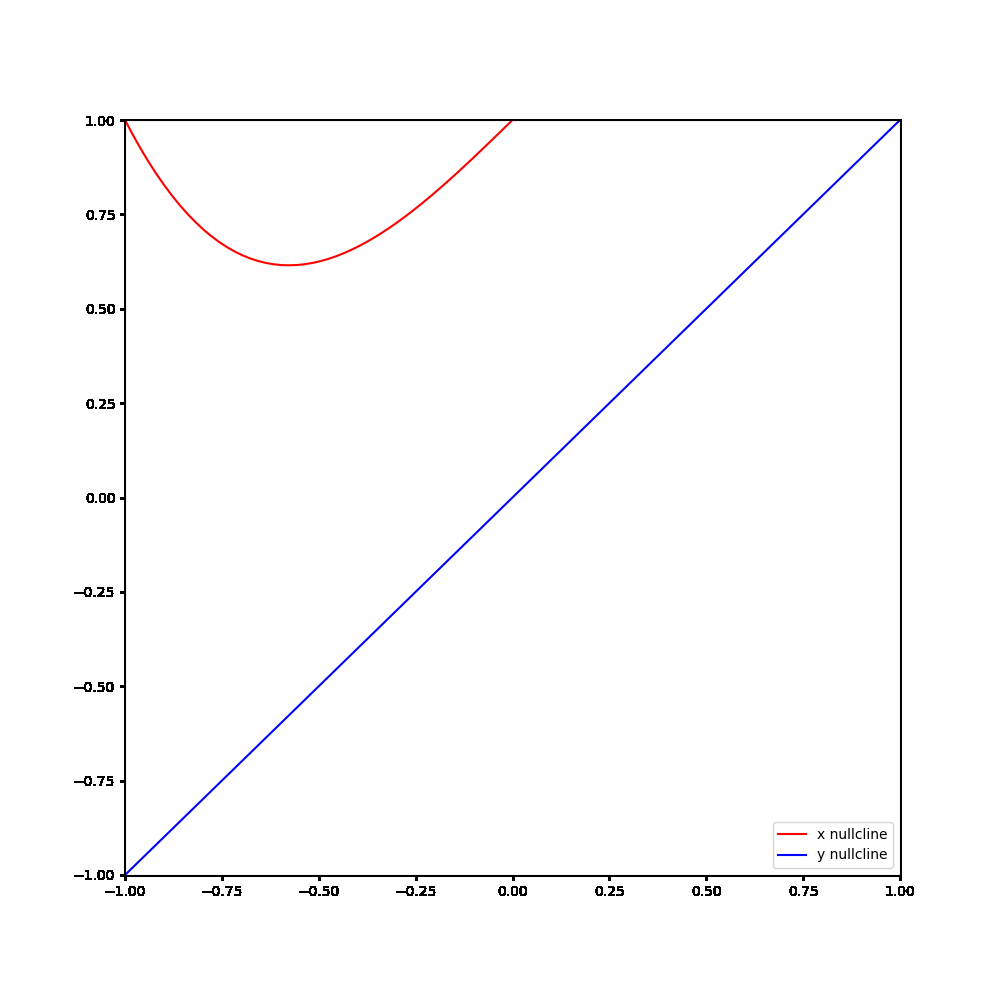

In [10]:
# changing value of a and seeing the effect on the nullclines

i_list = np.linspace(-1,1,100)
k = 0 
for i in i_list:
    I = i
    a = 1   
    k = k +1
    figure(figsize=(10,10), dpi=100)
    plt.plot(x, x_nullcline(x, a), label='x nullcline', color = 'red')
    plt.plot(y, y_nullcline(y, a), label='y nullcline', color = 'blue')
    plt.legend()
    plt.xlim(-1,1)
    plt.ylim(-1,1)
    plt.savefig(str(k) + ' .png')
    plt.title("a = " + str(np.round(a, 2)) + "  I = " + str(np.round(I, 2) ))
    plt.close()
    plt.close('all')
    clear_output(wait=False)



import imageio
with imageio.get_writer('movie2.gif', mode='I' , duration = 0.15) as writer:
    for i in range(1,np.shape(a_list)[0]):
        filename = str(i) + ' .png'
        image = imageio.imread(filename)
        os.remove(filename)
        writer.append_data(image)



with open("movie2.gif",'rb') as f:
    display.Image(data=f.read(), format='png'  )



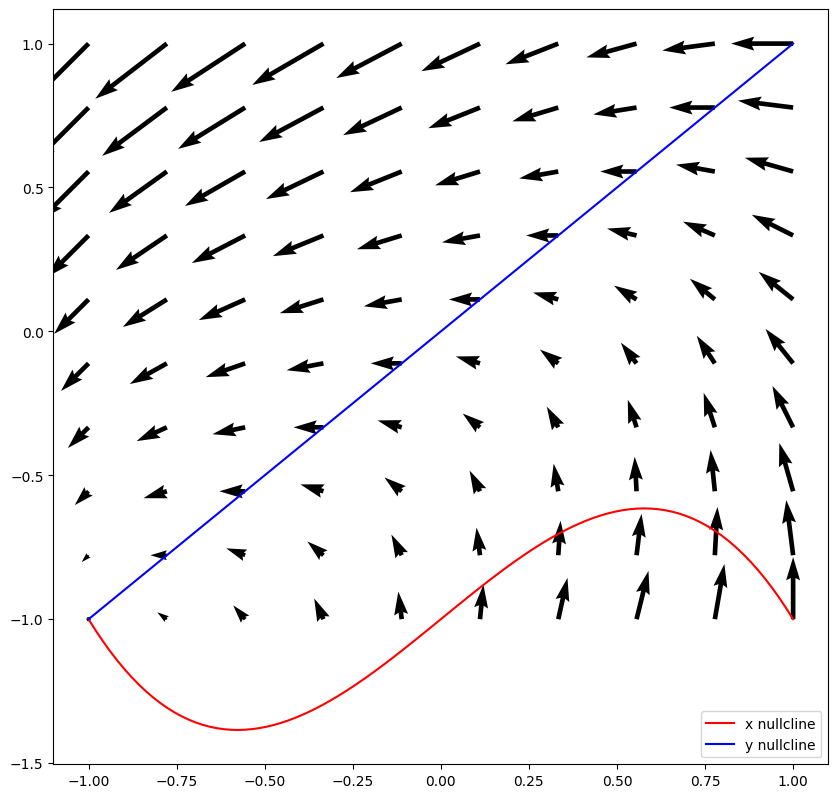

In [11]:

from scipy.integrate import odeint


#quiver plot over the nullclines -- downsampled for clarity

xd = np.linspace(-1, 1, 10)
yd = np.linspace(-1, 1, 10)

X, Y = np.meshgrid(xd, yd)

U = dxdt(X, Y, a)
V = dydt(X, Y, a)
figure(figsize=(10,10), dpi=100)
plt.quiver(X, Y, U, V)
plt.plot(x, x_nullcline(x, a), label='x nullcline' , color = 'red')
plt.plot(y, y_nullcline(y, a), label='y nullcline' , color = 'blue')
plt.legend()
clear_output(wait=False)
plt.show()



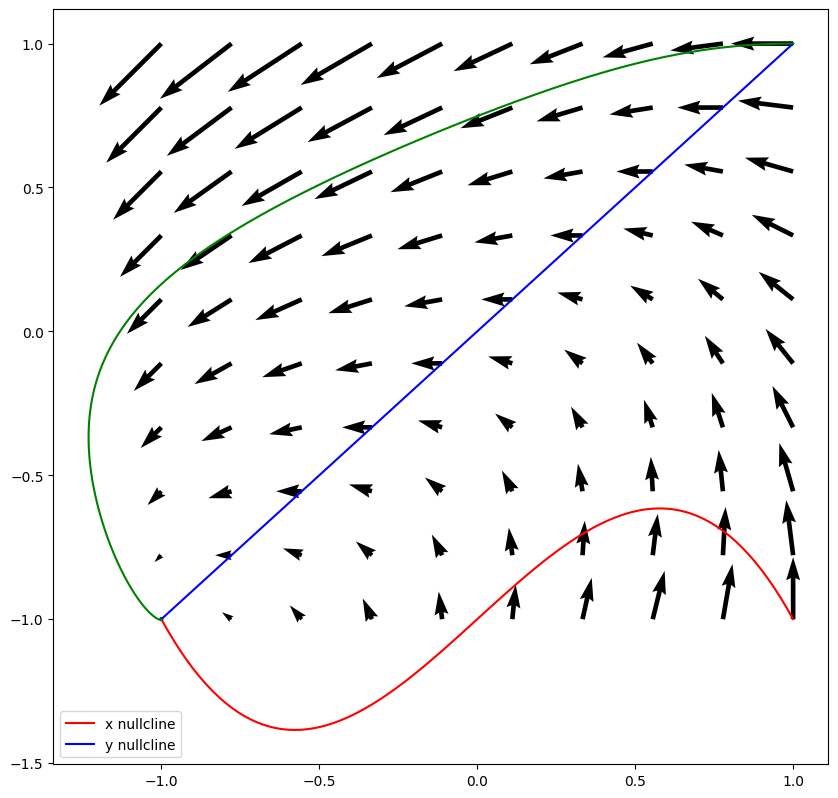

In [12]:
def dXdt(X, t, I, a):
    x, y = X
    return [dxdt(x, y, I), dydt(x, y, a)]

t = np.linspace(0, 50, 20000)

X0 = [1, 1]

sol = odeint(dXdt, X0, t, args=(I,a))
sol_x, sol_y = sol.T
figure(figsize=(10,10), dpi=100)
plt.quiver(X, Y, U, V)
plt.plot(x, x_nullcline(x, a), label='x nullcline' , color = 'red')
plt.plot(y, y_nullcline(y, a), label='y nullcline' , color = 'blue')
plt.legend()
clear_output(wait=False)
plt.plot(sol_x,sol_y ,  color = 'green')
plt.show()

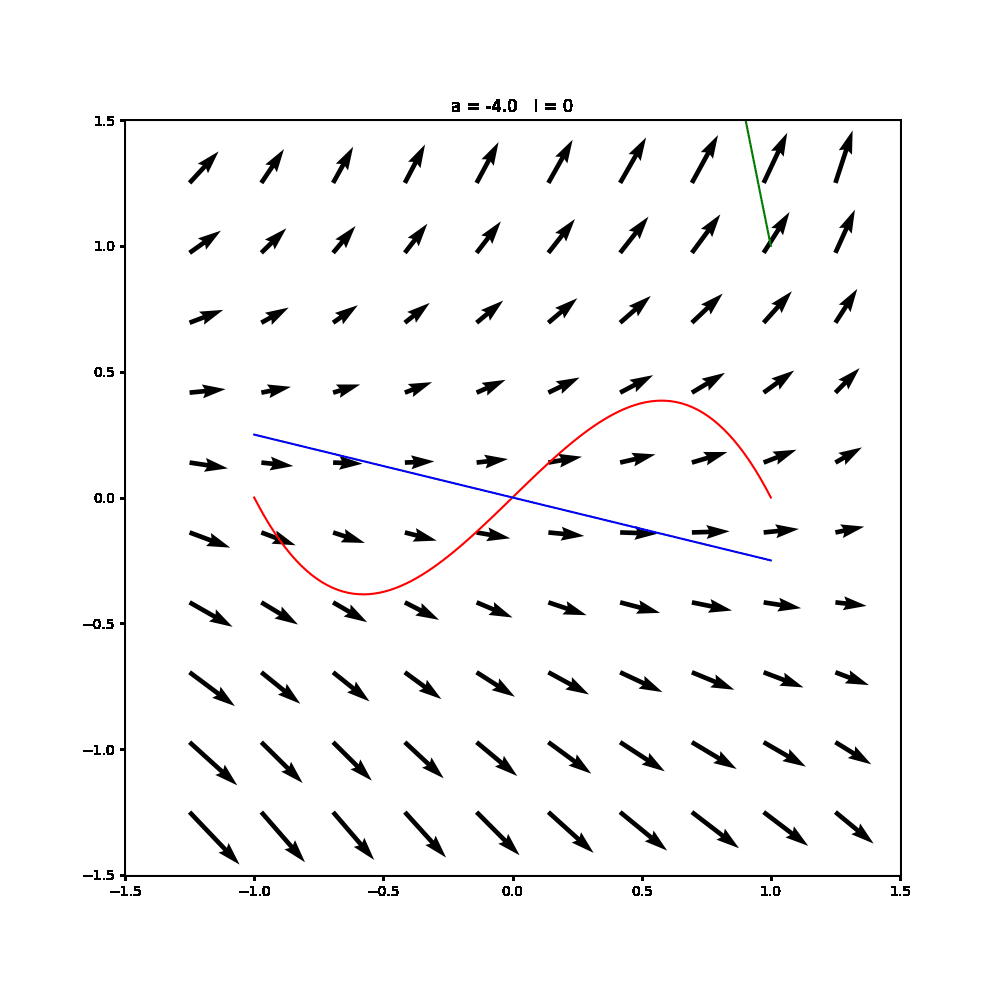

In [16]:
#@title for different value of a

a_list = np.linspace(-4,4,100)
k = 0 
for a in a_list:  
    k = k +1
    I = 0
    xd = np.linspace(-1.25, 1.25, 10)
    yd = np.linspace(-1.25, 1.25, 10)
    t = np.linspace(0, 100, 20000)
    X, Y = np.meshgrid(xd, yd)

    U = dxdt(X, Y, a)
    V = dydt(X, Y, a)
    def dXdt(X, t, I, a):
        x, y = X
        return [dxdt(x, y, I), dydt(x, y, a)]

    

    X0 = [1, 1]

    sol = odeint(dXdt, X0, t, args=(I,a))
    sol_x, sol_y = sol.T
    figure(figsize=(10,10), dpi=100)
    plt.quiver(X, Y, U, V)
    plt.plot(x, x_nullcline(x, a), label='x nullcline' , color = 'red')
    plt.plot(y, y_nullcline(y, a), label='y nullcline' , color = 'blue')
    plt.plot(sol_x,sol_y ,  color = 'green')
    plt.xlim(-1.5,1.5)
    plt.ylim(-1.5,1.5)
    plt.title("a = " + str(np.round(a, 2)) + "   I = " + str(np.round(I, 2) ))
    plt.savefig(str(k) + ' .png')
    plt.close()
    plt.close('all')
    clear_output(wait=False)



import imageio
with imageio.get_writer('movie3.gif', mode='I' , duration = 0.15) as writer:
    for i in range(1,np.shape(a_list)[0]):
        filename = str(i) + ' .png'
        image = imageio.imread(filename)
        os.remove(filename)
        writer.append_data(image)



with open("movie3.gif",'rb') as f:
    display.Image(data=f.read(), format='png'  )


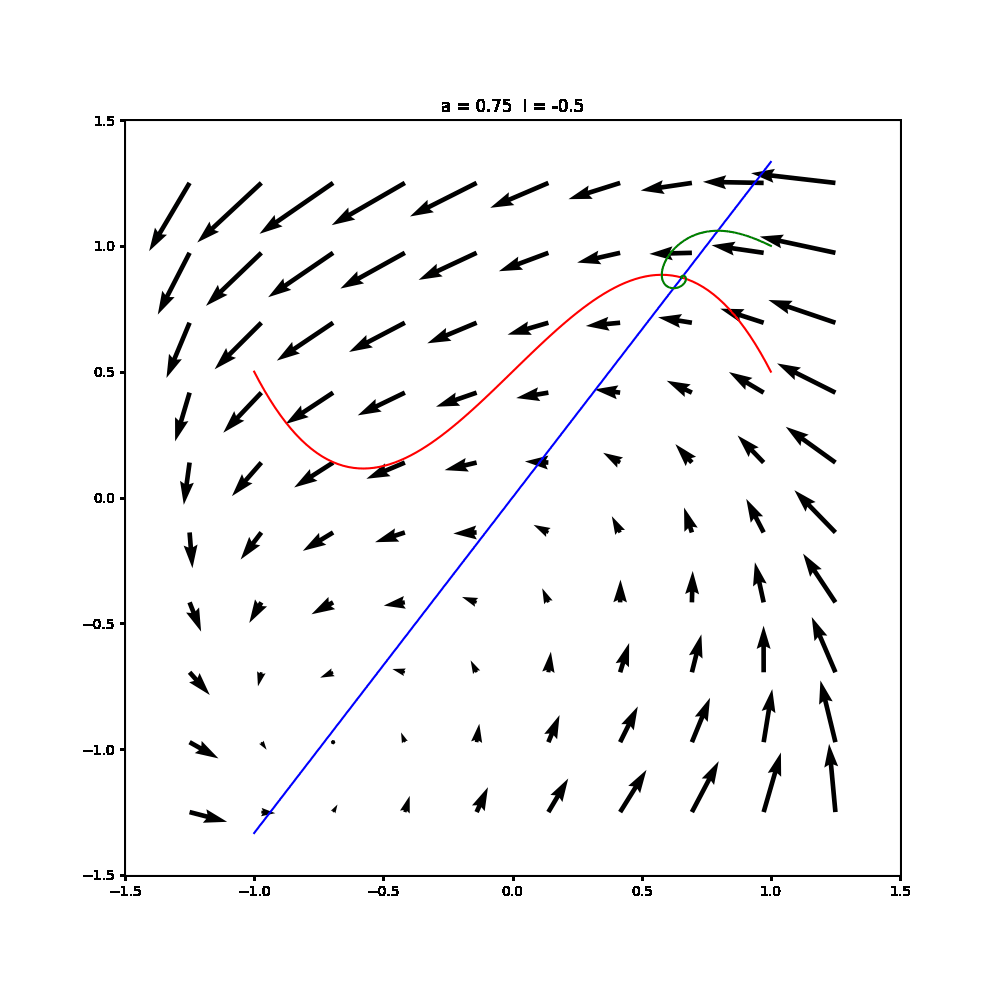

In [14]:
#@title for different value of i

i_list = np.linspace(-0.5,1.0,100)
k = 0 
for i in i_list:  
    k = k +1
    I = i
    a= 0.75
    xd = np.linspace(-1.25, 1.25, 10)
    yd = np.linspace(-1.25, 1.25, 10)
    t = np.linspace(0, 100, 20000)
    X, Y = np.meshgrid(xd, yd)

    U = dxdt(X, Y, a)
    V = dydt(X, Y, a)
    def dXdt(X, t, I, a):
        x, y = X
        return [dxdt(x, y, I), dydt(x, y, a)]

    

    X0 = [1, 1]

    sol = odeint(dXdt, X0, t, args=(I,a))
    sol_x, sol_y = sol.T
    figure(figsize=(10,10), dpi=100)
    plt.quiver(X, Y, U, V)
    plt.plot(x, x_nullcline(x, a), label='x nullcline' , color = 'red')
    plt.plot(y, y_nullcline(y, a), label='y nullcline' , color = 'blue')
    plt.plot(sol_x,sol_y ,  color = 'green')
    plt.xlim(-1.5,1.5)
    plt.ylim(-1.5,1.5)
    plt.title("a = " + str(np.round(a, 2)) + "  I = " + str(np.round(I, 2) ))
    plt.savefig(str(k) + ' .png')
    plt.close()
    plt.close('all')
    clear_output(wait=False)



import imageio
with imageio.get_writer('movie3.gif', mode='I' , duration = 0.15) as writer:
    for i in range(1,np.shape(a_list)[0]):
        filename = str(i) + ' .png'
        image = imageio.imread(filename)
        os.remove(filename)
        writer.append_data(image)



with open("movie3.gif",'rb') as f:
    display.Image(data=f.read(), format='png'  )